# Path Planning

Planning is a crucial part of the autonomous driving pipeline. The subfield of planning corresponds to higher-level reasoning, where as last week's topic - control - focuses more on the specifics of how to move accurately. Planners come in many forms, but here, we're concerned with _motion planning_, or the task of moving from point A to B while avoiding collision with known obstacles. For simplicity, we will focusing on planning in a two-dimensional workspace, although many of the algorithms we see here can easily be extended to higher-dimensional spaces. 

In this exercise, you will complete the implementation of a popular robotic motion planning algorithm: Rapidly-Exploring Random Trees, or RRT for short. The successful completion of this algorithm will allow your simulated Duckiebot to go from your current position to a goal position in a road with obstacles. 

First, run this code to initialize the environment:

In [1]:
#%matplotlib 
#from matplotlib import use
#use('TkAgg')
import logging
logger = logging.getLogger("gym-duckietown")
logger.disabled = True

import os, sys
import math
module_path = os.path.abspath(os.path.join('..'))
if module_path not in sys.path:
    sys.path.append(module_path)
    
from utils.helpers import launch_env, wrap_env, view_results_ipython, change_exercise, force_done, topViewSimulator, load_env_obstacles, proportional_next_point_controller, get_dist_to_goal
from simulation.gym_duckietown.wrappers import DiscreteWrapper, UndistortWrapper, SteeringToWheelVelWrapper
from simulation.gym_duckietown.simulator import Simulator
import matplotlib.pyplot as plt
import numpy as np
from pprint import pprint

INFO:aido-protocols:aido-protocols 5.0.5
23:27:38|zn|__init__.py:6|<module>(): zn 2.0.3
23:27:39|zj|__init__.py:5|<module>(): zj 2.0.4
23:27:40|dt-world|__init__.py:12|<module>(): duckietown-world 1.0.30
23:27:40|dt-world|__init__.py:22|<module>(): contracts 1.8.12 


In [14]:
local_env = topViewSimulator()
local_env = launch_env(simclass = topViewSimulator, map_name ="loop_obstacles")
local_env = wrap_env(local_env)
local_env = SteeringToWheelVelWrapper(local_env)
_ = local_env.reset()

print("Environment initialized.")

/usr/local/lib/python3.6/dist-packages/gym/logger.py:30: UserWarning: WARN: Trying to monitor an environment which has no 'spec' set. This usually means you did not create it via 'gym.make', and is recommended only for advanced users.
  warnings.warn(colorize('%s: %s'%('WARN', msg % args), 'yellow'))


Environment initialized.


You can view of the environment your Duckiebot will go through. Apart from the loop, you should see some cones, a couple of lost Duckies and another Duckiebot on the road!

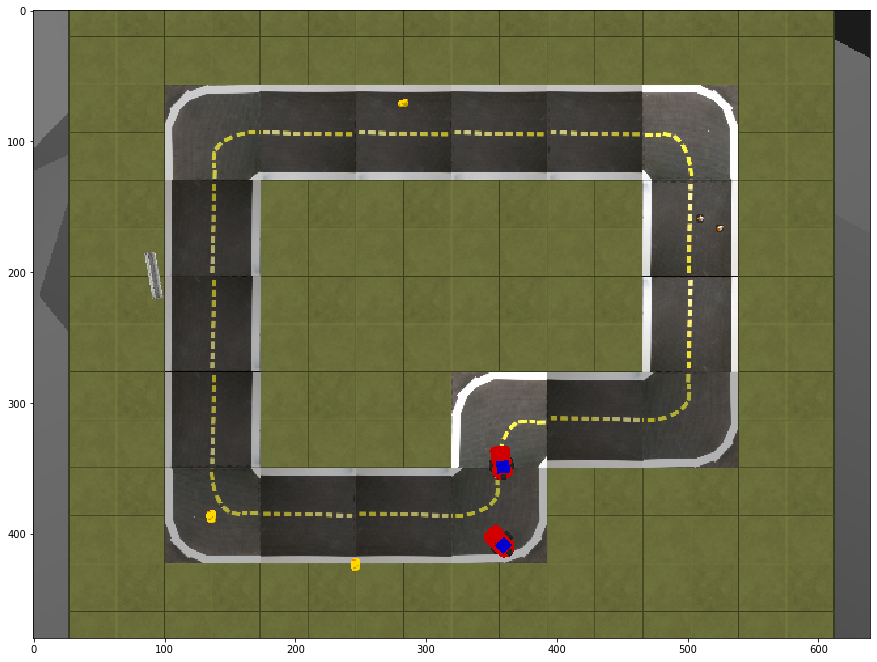

In [6]:
plt.figure(0, figsize = [15,21])
obs, _, d, _ = local_env.step([0, 0])
plt.imshow(obs, cmap='gray')
plt.show()

As we are working on path planning, we will make use of certain ground truth values that we can get from the simulator: the list of obstacles and the goal position.

For simplicity, the obstacles in this exercise are stationary and are modelled as circular. Their information, stored inside of `list_obstacles`, is a list containing each obstacle's parameters: `[x, y, diameter]`. 

Undrivable tiles are also represented by circular obstacles, helping us ensure that the Duckiebot can only drive on the road.

In [8]:
# Goal position
goal = [1,1]

# List of obstacles
list_obstacles = load_env_obstacles(local_env)
print('\n'.join('[{:f}, {:f}, {:f}]'.format(*obstacle) for obstacle in list_obstacles))

[2.047500, 0.702000, 0.172371]
[3.978000, 1.462500, 0.164603]
[3.861000, 1.404000, 0.164603]
[0.877500, 3.217500, 0.196495]
[2.632500, 3.363750, 0.317827]
[0.526500, 1.755000, 0.361167]
[1.755000, 3.510000, 0.196495]
[0.292500, 0.292500, 0.960500]
[0.292500, 0.877500, 0.960500]
[0.292500, 1.462500, 0.960500]
[0.292500, 2.047500, 0.960500]
[0.292500, 2.632500, 0.960500]
[0.292500, 3.217500, 0.960500]
[0.292500, 3.802500, 0.960500]
[0.877500, 0.292500, 0.960500]
[0.877500, 3.802500, 0.960500]
[1.462500, 0.292500, 0.960500]
[1.462500, 1.462500, 0.960500]
[1.462500, 2.047500, 0.960500]
[1.462500, 2.632500, 0.960500]
[1.462500, 3.802500, 0.960500]
[2.047500, 0.292500, 0.960500]
[2.047500, 1.462500, 0.960500]
[2.047500, 2.047500, 0.960500]
[2.047500, 2.632500, 0.960500]
[2.047500, 3.802500, 0.960500]
[2.632500, 0.292500, 0.960500]
[2.632500, 1.462500, 0.960500]
[2.632500, 2.047500, 0.960500]
[2.632500, 3.802500, 0.960500]
[3.217500, 0.292500, 0.960500]
[3.217500, 1.462500, 0.960500]
[3.21750

## Part 1. RRT

The following function allows you to build a path from your current position to the goal position while avoiding obstacles. The path is a list of x-y positions going backwards from the end goal to the start position. The planner uses the RRT (Rapidly Exploring Random Trees) algorithm that you have seen in class.

In this function, the `RRT_planner` class is called from your file `notebooks/code/exercise_03_path_planning/RRT.py`.

In [9]:
from notebooks.code.exercise_04_path_planning.RRT import RRT_planner
from IPython.display import clear_output

def make_plan(env, clear = False):
    ### Problem parameters
    # Start position
    start = env.cur_pos[0], env.cur_pos[2]
    # Area of exploration [x_min, x_max, y_min, y_max]
    rand_area = [0, 4.5, 0, 4.5]
    # No animation because we will call it many times in a row
    show_anim = False
    plt.figure(1)
    
    ### RRT Parameters
    # Distance of each step
    max_branch_length = 0.3
    # Resolution of the path (at which obstacles are checked)
    path_res = 0.1
    # Goal sampling rate : probability to artificially sample the goal
    goal_sample_rate=5
    # Max number of iterations
    max_iter = 10000
    
    ### Initializing and running the planner
    rrt_planner = RRT_planner(start, goal, list_obstacles, rand_area, max_branch_length, path_res, goal_sample_rate, max_iter)
    path = rrt_planner.plan(show_anim=show_anim)

    ### Finalization
    if path is None:
        print("Cannot find path.")
    else:
        print("Found path!")
        if True:
            if clear: clear_output()
            rrt_planner.draw_graph(final_path = path)
    return path

The control function, `proportional_next_point_controller`, will make the Duckiebot go to the next point of the path in two steps using a very basic proportional control: first, your robot turns towards the goal point, then, it moves straight towards it. While more complicated controllers can be implemented here, we will use the simple one described for demonstration purposes.

Finally, we're ready to go! Let's alternate both planning and driving until you reach the goal.

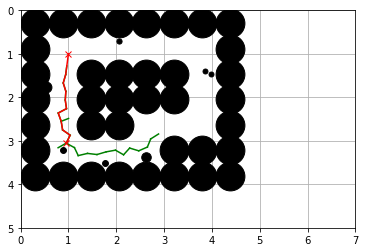

Crash


In [15]:
from IPython.display import clear_output

dist_to_goal =  get_dist_to_goal(local_env.cur_pos, goal)
done = False

while dist_to_goal > 0.3 and not done:
    my_path = make_plan(local_env, clear = True)
    if my_path is None:
        break
    done = proportional_next_point_controller(local_env, my_path)
    dist_to_goal =  get_dist_to_goal(local_env.cur_pos, goal)

After running the code above, you'll see that your output will be `Cannot find path!`, which is because the RRT planner is incomplete.

**Task 1:** Finish implementing the `plan()` function of the `RRT_planner` class, which lives in `notebooks/code/exercise_04_path_planning/RRT.py` (l. 55 to 62)

Once you are done and the code above works (don't forget to run again the definition of `make_plan()` to enact your modifications), you can see what is happening here:

In [16]:
local_env.close()
view_results_ipython(local_env)

*What would happen if the Duckiebot was placed in an environment with very small obstacles? Would RRT be able to avoid them? Which parameters would you need to adjust, and what would be the side effects?*

Put your answers inside of the zip file, in section 1 of a file named **04-path-planning.txt**. 

In section 2 of this file, answer the following question:

*Is it needed to re-plan everytime the first path point is reached? In which situation would it be important? What are the advantages and disadvantages of doing so?*


## Part 2. Following a path

**Task 2**
In certain, static environments, instead of replanning at every node, we can follow the entirety of the first created path. Complete function `next_action()` of the `RTT_Path_Follower` class found in `notebooks/code/exercise_04_path_planning/RRT.py` so that it outputs the right commands to reach the goal following the path.


/usr/local/lib/python3.6/dist-packages/gym/logger.py:30: UserWarning: WARN: Trying to monitor an environment which has no 'spec' set. This usually means you did not create it via 'gym.make', and is recommended only for advanced users.
  warnings.warn(colorize('%s: %s'%('WARN', msg % args), 'yellow'))


dist to goal is 2.054096521157636
Reached goal
Found path!


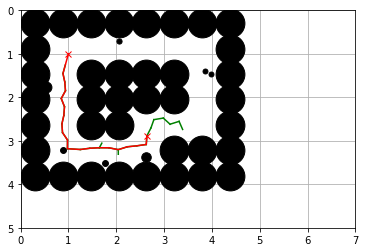

trying. dist to goal is 2.054096521157636
current v, omega: 0.0 -0.19294005963931227
trying. dist to goal is 2.4993394141722898
current v, omega: 0.0 -0.18395147079052077
trying. dist to goal is 2.4993394141722898
current v, omega: 0.0 -0.17538163753682756
trying. dist to goal is 2.4993394141722898
current v, omega: 0.0 -0.16721105111535906
trying. dist to goal is 2.4993394141722898
current v, omega: 0.0 -0.15942111162710582
trying. dist to goal is 2.4993394141722898
current v, omega: 0.0 -0.15199408569525819
trying. dist to goal is 2.4993394141722898
current v, omega: 0.0 -0.14491306609613108
trying. dist to goal is 2.4993394141722898
current v, omega: 0.0 -0.13816193327078174
trying. dist to goal is 2.4993394141722898
current v, omega: 0.0 -0.1317253186297016
trying. dist to goal is 2.4993394141722898
current v, omega: 0.0 -0.12558856956705533
trying. dist to goal is 2.4993394141722898
current v, omega: 0.0 -0.11973771610481165
trying. dist to goal is 2.4993394141722898
current v, om

trying. dist to goal is 2.6027307972124496
current v, omega: 0.057868564777119956 0.0
trying. dist to goal is 2.604698782665997
current v, omega: 0.0 -0.02049191907137704
trying. dist to goal is 2.604698782665997
current v, omega: 0.05517315452249503 0.0
trying. dist to goal is 2.6065746398151717
current v, omega: 0.0 -0.02049184914711244
trying. dist to goal is 2.6065746398151717
current v, omega: 0.05260329146720927 0.0
trying. dist to goal is 2.6083626268717923
current v, omega: 0.0 -0.020491779223569928
trying. dist to goal is 2.6083626268717923
current v, omega: 0.050153127856252255 0.0
trying. dist to goal is 2.6100668102397973
current v, omega: 0.0 -1.1240524683602535
trying. dist to goal is 2.6100668102397973
current v, omega: 0.0 -1.0716857099926669
trying. dist to goal is 2.6100668102397973
current v, omega: 0.0 -1.0217585863032808
trying. dist to goal is 2.6100668102397973
current v, omega: 0.0 -0.9741574408896643
trying. dist to goal is 2.6100668102397973
current v, omega: 

trying. dist to goal is 2.597335804213517
current v, omega: 0.0 -0.020434834885967756
trying. dist to goal is 2.597335804213517
current v, omega: 0.17089970521480694 0.0
trying. dist to goal is 2.5951879790901575
current v, omega: 0.0 -0.020434765544429467
trying. dist to goal is 2.5951879790901575
current v, omega: 0.162939505520136 0.0
trying. dist to goal is 2.5931543368602594
current v, omega: 0.0 -0.02043469620359817
trying. dist to goal is 2.5931543368602594
current v, omega: 0.15535007754415797 0.0
trying. dist to goal is 2.591227994928851
current v, omega: 0.0 -0.020434626863472527
trying. dist to goal is 2.591227994928851
current v, omega: 0.14811415141063156 0.0
trying. dist to goal is 2.5894025430404595
current v, omega: 0.0 -0.02043455752405121
trying. dist to goal is 2.5894025430404595
current v, omega: 0.14121526164290288 0.0
trying. dist to goal is 2.5876720075391235
current v, omega: 0.0 -0.020434488185335997
trying. dist to goal is 2.5876720075391235
current v, omega: 

trying. dist to goal is 2.565946164118786
current v, omega: 0.0 -0.02386751552959021
trying. dist to goal is 2.565946164118786
current v, omega: 0.0 -0.02275558841430536
trying. dist to goal is 2.565946164118786
current v, omega: 0.0 -0.02169546316789006
trying. dist to goal is 2.565946164118786
current v, omega: 0.0 -0.020684726472437465
trying. dist to goal is 2.565946164118786
current v, omega: 0.24841111032059066 0.0
trying. dist to goal is 2.56106448807002
current v, omega: 0.0 -0.020684654555847004
trying. dist to goal is 2.56106448807002
current v, omega: 0.23684062601346026 0.0
trying. dist to goal is 2.55644063125246
current v, omega: 0.0 -0.020684582640006166
trying. dist to goal is 2.55644063125246
current v, omega: 0.2258090713179796 0.0
trying. dist to goal is 2.5520595400199007
current v, omega: 0.0 -0.020684510724914507
trying. dist to goal is 2.5520595400199007
current v, omega: 0.21529134399035532 0.0
trying. dist to goal is 2.5479071363041963
current v, omega: 0.0 -0.

trying. dist to goal is 2.485875074373105
current v, omega: 0.0 0.03580658666100023
trying. dist to goal is 2.485875074373105
current v, omega: 0.0 0.034138448451775716
trying. dist to goal is 2.485875074373105
current v, omega: 0.0 0.03254802457794481
trying. dist to goal is 2.485875074373105
current v, omega: 0.0 0.03103169452539678
trying. dist to goal is 2.485875074373105
current v, omega: 0.0 0.029586006450605495
trying. dist to goal is 2.485875074373105
current v, omega: 0.0 0.028207669322694695
trying. dist to goal is 2.485875074373105
current v, omega: 0.0 0.026893545431583732
trying. dist to goal is 2.485875074373105
current v, omega: 0.0 0.02564064324515991
trying. dist to goal is 2.485875074373105
current v, omega: 0.0 0.024446110599217086
trying. dist to goal is 2.485875074373105
current v, omega: 0.0 0.023307228204657804
trying. dist to goal is 2.485875074373105
current v, omega: 0.0 0.022221403457177935
trying. dist to goal is 2.485875074373105
current v, omega: 0.0 0.021

trying. dist to goal is 2.4432345599551604
current v, omega: 0.0 -0.15311547555216265
trying. dist to goal is 2.4432345599551604
current v, omega: 0.0 -0.14598221323899407
trying. dist to goal is 2.4432345599551604
current v, omega: 0.0 -0.13918127155536997
trying. dist to goal is 2.4432345599551604
current v, omega: 0.0 -0.13269716852460522
trying. dist to goal is 2.4432345599551604
current v, omega: 0.0 -0.12651514343610737
trying. dist to goal is 2.4432345599551604
current v, omega: 0.0 -0.12062112324341667
trying. dist to goal is 2.4432345599551604
current v, omega: 0.0 -0.11500169052767406
trying. dist to goal is 2.4432345599551604
current v, omega: 0.0 -0.10964405295359203
trying. dist to goal is 2.4432345599551604
current v, omega: 0.0 -0.10453601414839309
trying. dist to goal is 2.4432345599551604
current v, omega: 0.0 -0.0996659459374265
trying. dist to goal is 2.4432345599551604
current v, omega: 0.0 -0.09502276187325576
trying. dist to goal is 2.4432345599551604
current v, o

trying. dist to goal is 2.3538139978591714
current v, omega: 0.0 -0.020643077249317354
trying. dist to goal is 2.3538139978591714
current v, omega: 0.0671293575136068 0.0
trying. dist to goal is 2.3522715678146255
current v, omega: 0.0 -0.020643005766260103
trying. dist to goal is 2.3522715678146255
current v, omega: 0.06400260600048567 0.0
trying. dist to goal is 2.350801416795569
current v, omega: 0.0 -0.020642934283948478
trying. dist to goal is 2.350801416795569
current v, omega: 0.061021492329067964 0.0
trying. dist to goal is 2.3494000296762123
current v, omega: 0.0 -0.020642862802378925
trying. dist to goal is 2.3494000296762123
current v, omega: 0.058179232979705384 0.0
trying. dist to goal is 2.348064073397797
current v, omega: 0.0 -0.020642791321552334
trying. dist to goal is 2.348064073397797
current v, omega: 0.05546936039553065 0.0
trying. dist to goal is 2.3467903866372475
current v, omega: 0.0 -0.020642719841469148
trying. dist to goal is 2.3467903866372475
current v, om

trying. dist to goal is 2.275785301615376
current v, omega: 0.0 0.02048135624126557
trying. dist to goal is 2.275785301615376
current v, omega: 0.07167313990185946 0.0
trying. dist to goal is 2.274643513254167
current v, omega: 0.0 0.020481286425077183
trying. dist to goal is 2.274643513254167
current v, omega: 0.06833473748694703 0.0
trying. dist to goal is 2.2735617970536914
current v, omega: 0.0 0.020481216609601116
trying. dist to goal is 2.2735617970536914
current v, omega: 0.06515183168329104 0.0
trying. dist to goal is 2.272536864904797
current v, omega: 0.0 0.020481146794836924
trying. dist to goal is 2.272536864904797
current v, omega: 0.06211717974647906 0.0
trying. dist to goal is 2.27156561950307
current v, omega: 0.0 0.020481076980786828
trying. dist to goal is 2.27156561950307
current v, omega: 0.0592238762857213 0.0
trying. dist to goal is 2.2706451424342187
current v, omega: 0.0 0.020481007167448162
trying. dist to goal is 2.2706451424342187
current v, omega: 0.05646533

trying. dist to goal is 2.2258752316327626
current v, omega: 0.06545417593093021 0.0
trying. dist to goal is 2.2253435195202877
current v, omega: 0.0 0.020525534073526863
trying. dist to goal is 2.2253435195202877
current v, omega: 0.062405444003437414 0.0
trying. dist to goal is 2.224843085807502
current v, omega: 0.0 0.020525463804592636
trying. dist to goal is 2.224843085807502
current v, omega: 0.05949871624866323 0.0
trying. dist to goal is 2.2243720071496145
current v, omega: 0.0 0.02052539353637961
trying. dist to goal is 2.2243720071496145
current v, omega: 0.05672737838074007 0.0
trying. dist to goal is 2.223928486076192
current v, omega: 0.0 0.020525323268894002
trying. dist to goal is 2.223928486076192
current v, omega: 0.054085124194721806 0.0
trying. dist to goal is 2.223510842151884
current v, omega: 0.0 0.02052525300212471
trying. dist to goal is 2.223510842151884
current v, omega: 0.051565941216756506 0.0
trying. dist to goal is 2.2231175037990747
current v, omega: 0.0 

trying. dist to goal is 2.2117149570331844
current v, omega: 0.056779286628418156 0.0
trying. dist to goal is 2.2117234514193296
current v, omega: 0.0 0.020246817187415722
trying. dist to goal is 2.2117234514193296
current v, omega: 0.05413460033622192 0.0
trying. dist to goal is 2.211736874975716
current v, omega: 0.0 0.02024674974228091
trying. dist to goal is 2.211736874975716
current v, omega: 0.05161309920208294 0.0
trying. dist to goal is 2.211754619152667
current v, omega: 0.0 -0.17595426486959997
trying. dist to goal is 2.211754619152667
current v, omega: 0.0 -0.16775700119060621
trying. dist to goal is 2.211754619152667
current v, omega: 0.0 -0.1599416272707086
trying. dist to goal is 2.211754619152667
current v, omega: 0.0 -0.15249035183298654
trying. dist to goal is 2.211754619152667
current v, omega: 0.0 -0.1453862124510632
trying. dist to goal is 2.211754619152667
current v, omega: 0.0 -0.13861303693505755
trying. dist to goal is 2.211754619152667
current v, omega: 0.0 -0.

trying. dist to goal is 2.1882591339042605
current v, omega: 0.1014828894475252 0.0
trying. dist to goal is 2.1879187029541884
current v, omega: 0.0 -0.020558954757710524
trying. dist to goal is 2.1879187029541884
current v, omega: 0.09675601116650676 0.0
trying. dist to goal is 2.1875992873076417
current v, omega: 0.0 -0.020558884144978862
trying. dist to goal is 2.1875992873076417
current v, omega: 0.09224930180038707 0.0
trying. dist to goal is 2.187299249799114
current v, omega: 0.0 -0.02055881353297684
trying. dist to goal is 2.187299249799114
current v, omega: 0.08795250630411705 0.0
trying. dist to goal is 2.187017097927584
current v, omega: 0.0 -0.020558742921702677
trying. dist to goal is 2.187017097927584
current v, omega: 0.0838558472929295 0.0
trying. dist to goal is 2.186751470545522
current v, omega: 0.0 -0.020558672311156823
trying. dist to goal is 2.186751470545522
current v, omega: 0.0799500027938422 0.0
trying. dist to goal is 2.186501125774259
current v, omega: 0.0 -

trying. dist to goal is 2.1847773411170155
current v, omega: 0.0 -0.05282504739763927
trying. dist to goal is 2.1847773411170155
current v, omega: 0.0 -0.05036406219392897
trying. dist to goal is 2.1847773411170155
current v, omega: 0.0 -0.04801772805957394
trying. dist to goal is 2.1847773411170155
current v, omega: 0.0 -0.04578070369155274
trying. dist to goal is 2.1847773411170155
current v, omega: 0.0 -0.043647896624627425
trying. dist to goal is 2.1847773411170155
current v, omega: 0.0 -0.041614451638620986
trying. dist to goal is 2.1847773411170155
current v, omega: 0.0 -0.03967573970577121
trying. dist to goal is 2.1847773411170155
current v, omega: 0.0 -0.037827347452998206
trying. dist to goal is 2.1847773411170155
current v, omega: 0.0 -0.03606506711509949
trying. dist to goal is 2.1847773411170155
current v, omega: 0.0 -0.03438488695599862
trying. dist to goal is 2.1847773411170155
current v, omega: 0.0 -0.03278298213624553
trying. dist to goal is 2.1847773411170155
current 

trying. dist to goal is 2.0300835591817497
current v, omega: 0.0 0.11506123056195916
trying. dist to goal is 2.0300835591817497
current v, omega: 0.0 0.10970081916843677
trying. dist to goal is 2.0300835591817497
current v, omega: 0.0 0.10459013576902199
trying. dist to goal is 2.0300835591817497
current v, omega: 0.0 0.09971754616878803
trying. dist to goal is 2.0300835591817497
current v, omega: 0.0 0.0950719581804913
trying. dist to goal is 2.0300835591817497
current v, omega: 0.0 0.09064279637380634
trying. dist to goal is 2.0300835591817497
current v, omega: 0.0 0.08641997800092938
trying. dist to goal is 2.0300835591817497
current v, omega: 0.0 0.08239389004374664
trying. dist to goal is 2.0300835591817497
current v, omega: 0.0 0.07855536733031787
trying. dist to goal is 2.0300835591817497
current v, omega: 0.0 0.07489567167085753
trying. dist to goal is 2.0300835591817497
current v, omega: 0.0 0.07140647196571615
trying. dist to goal is 2.0300835591817497
current v, omega: 0.0 0

trying. dist to goal is 1.8622563235124259
current v, omega: 0.05642932652138339 0.0
trying. dist to goal is 1.860004935690004
current v, omega: 0.0 0.02065340486408207
trying. dist to goal is 1.860004935690004
current v, omega: 0.05380096163760715 0.0
trying. dist to goal is 1.8578605848208343
current v, omega: 0.0 0.020653333273684904
trying. dist to goal is 1.8578605848208343
current v, omega: 0.05129502071648966 0.0
trying. dist to goal is 1.8558181519717942
current v, omega: 0.0 -0.3426181981493539
trying. dist to goal is 1.8558181519717942
current v, omega: 0.0 -0.3266564838167494
trying. dist to goal is 1.8558181519717942
current v, omega: 0.0 -0.3114383853393792
trying. dist to goal is 1.8558181519717942
current v, omega: 0.0 -0.2969292595374047
trying. dist to goal is 1.8558181519717942
current v, omega: 0.0 -0.2830960771690185
trying. dist to goal is 1.8558181519717942
current v, omega: 0.0 -0.26990734774115843
trying. dist to goal is 1.8558181519717942
current v, omega: 0.0 

trying. dist to goal is 1.7231400583753707
current v, omega: 0.0 -0.020528426222895968
trying. dist to goal is 1.7231400583753707
current v, omega: 0.10887752719114582 0.0
trying. dist to goal is 1.718194673344733
current v, omega: 0.0 -0.020528355924255948
trying. dist to goal is 1.718194673344733
current v, omega: 0.10380621783190253 0.0
trying. dist to goal is 1.7134792957165526
current v, omega: 0.0 -0.020528285626337572
trying. dist to goal is 1.7134792957165526
current v, omega: 0.09897112046751448 0.0
trying. dist to goal is 1.7089831987494468
current v, omega: 0.0 -0.020528215329141508
trying. dist to goal is 1.7089831987494468
current v, omega: 0.09436123279049298 0.0
trying. dist to goal is 1.7046961585894773
current v, omega: 0.0 -0.020528145032669087
trying. dist to goal is 1.7046961585894773
current v, omega: 0.08996606495998664 0.0
trying. dist to goal is 1.7006084304839602
current v, omega: 0.0 -0.020528074736918533
trying. dist to goal is 1.7006084304839602
current v, o

trying. dist to goal is 1.6028498319794569
current v, omega: 0.0 -0.0202553499791871
trying. dist to goal is 1.6028498319794569
current v, omega: 0.18507476006307125 0.0
trying. dist to goal is 1.5942389471259721
current v, omega: 0.0 -0.020255282448749412
trying. dist to goal is 1.5942389471259721
current v, omega: 0.17645428189182288 0.0
trying. dist to goal is 1.5860296607311457
current v, omega: 0.0 -0.02025521491898785
trying. dist to goal is 1.5860296607311457
current v, omega: 0.16823533141614835 0.0
trying. dist to goal is 1.578203252279771
current v, omega: 0.0 -0.020255147389901307
trying. dist to goal is 1.578203252279771
current v, omega: 0.1603992061368583 0.0
trying. dist to goal is 1.570741873283618
current v, omega: 0.0 -0.020255079861490444
trying. dist to goal is 1.570741873283618
current v, omega: 0.1529280746863707 0.0
trying. dist to goal is 1.5636285067041538
current v, omega: 0.0 -0.020255012333754596
trying. dist to goal is 1.5636285067041538
current v, omega: 0

trying. dist to goal is 1.3879219690619393
current v, omega: 0.16964233315149588 0.0
trying. dist to goal is 1.380022612625765
current v, omega: 0.0 0.020668961121402818
trying. dist to goal is 1.380022612625765
current v, omega: 0.16174073584226561 0.0
trying. dist to goal is 1.3724910087038071
current v, omega: 0.0 0.020668889369121368
trying. dist to goal is 1.3724910087038071
current v, omega: 0.15420717896887493 0.0
trying. dist to goal is 1.3653100387397112
current v, omega: 0.0 0.02066881761758732
trying. dist to goal is 1.3653100387397112
current v, omega: 0.14702451995202115 0.0
trying. dist to goal is 1.358463381231922
current v, omega: 0.0 0.020668745866800675
trying. dist to goal is 1.358463381231922
current v, omega: 0.14017641467905956 0.0
trying. dist to goal is 1.3519354745865293
current v, omega: 0.0 0.020668674116760766
trying. dist to goal is 1.3519354745865293
current v, omega: 0.13364728031304188 0.0
trying. dist to goal is 1.3457114817048037
current v, omega: 0.0 

trying. dist to goal is 1.267373837187628
current v, omega: 0.0 0.03458533180168755
trying. dist to goal is 1.267373837187628
current v, omega: 0.0 0.032974088764106124
trying. dist to goal is 1.267373837187628
current v, omega: 0.0 0.03143790945993152
trying. dist to goal is 1.267373837187628
current v, omega: 0.0 0.029973296859888032
trying. dist to goal is 1.267373837187628
current v, omega: 0.0 0.028576916852439238
trying. dist to goal is 1.267373837187628
current v, omega: 0.0 0.027245590653862894
trying. dist to goal is 1.267373837187628
current v, omega: 0.0 0.02597628757192183
trying. dist to goal is 1.267373837187628
current v, omega: 0.0 0.02476611810665652
trying. dist to goal is 1.267373837187628
current v, omega: 0.0 0.02361232737259389
trying. dist to goal is 1.267373837187628
current v, omega: 0.0 0.02251228882739964
trying. dist to goal is 1.267373837187628
current v, omega: 0.0 0.02146349829269667
trying. dist to goal is 1.267373837187628
current v, omega: 0.0 0.020463

trying. dist to goal is 1.082087118977992
current v, omega: 0.0 -0.251108829710067
trying. dist to goal is 1.082087118977992
current v, omega: 0.0 -0.2394103051486849
trying. dist to goal is 1.082087118977992
current v, omega: 0.0 -0.22825678522561543
trying. dist to goal is 1.082087118977992
current v, omega: 0.0 -0.21762287955472726
trying. dist to goal is 1.082087118977992
current v, omega: 0.0 -0.20748438062368946
trying. dist to goal is 1.082087118977992
current v, omega: 0.0 -0.1978182086868765
trying. dist to goal is 1.082087118977992
current v, omega: 0.0 -0.18860235922557322
trying. dist to goal is 1.082087118977992
current v, omega: 0.0 -0.17981585285587487
trying. dist to goal is 1.082087118977992
current v, omega: 0.0 -0.17143868757025293
trying. dist to goal is 1.082087118977992
current v, omega: 0.0 -0.16345179320406356
trying. dist to goal is 1.082087118977992
current v, omega: 0.0 -0.1558369880233479
trying. dist to goal is 1.082087118977992
current v, omega: 0.0 -0.148

trying. dist to goal is 0.9266359625284566
current v, omega: 0.0 -0.020031560722403308
trying. dist to goal is 0.9266359625284566
current v, omega: 0.07938294978538911 0.0
trying. dist to goal is 0.9230296411858357
current v, omega: 0.0 -0.020031495405594235
trying. dist to goal is 0.9230296411858357
current v, omega: 0.07568540654909311 0.0
trying. dist to goal is 0.9195927118436875
current v, omega: 0.0 -0.020031430089424873
trying. dist to goal is 0.9195927118436875
current v, omega: 0.07216008953608692 0.0
trying. dist to goal is 0.9163172058378888
current v, omega: 0.0 -0.020031364773894555
trying. dist to goal is 0.9163172058378888
current v, omega: 0.06879897669785463 0.0
trying. dist to goal is 0.9131955299986081
current v, omega: 0.0 -0.020031299459002172
trying. dist to goal is 0.9131955299986081
current v, omega: 0.06559441964129449 0.0
trying. dist to goal is 0.9102204489522855
current v, omega: 0.0 -0.02003123414474839
trying. dist to goal is 0.9102204489522855
current v, 

trying. dist to goal is 0.8042265085335434
current v, omega: 0.0 0.020825606240807648
trying. dist to goal is 0.8042265085335434
current v, omega: 0.15259126773077686 0.0
trying. dist to goal is 0.7971372612368993
current v, omega: 0.0 0.020825532844785943
trying. dist to goal is 0.7971372612368993
current v, omega: 0.1454838966320155 0.0
trying. dist to goal is 0.7903790409552358
current v, omega: 0.0 0.020825459449540062
trying. dist to goal is 0.7903790409552358
current v, omega: 0.13870757149138577 0.0
trying. dist to goal is 0.7839364019110192
current v, omega: 0.0 0.02082538605507045
trying. dist to goal is 0.7839364019110192
current v, omega: 0.13224687290534126 0.0
trying. dist to goal is 0.7777946179763481
current v, omega: 0.0 0.020825312661377104
trying. dist to goal is 0.7777946179763481
current v, omega: 0.12608709967272674 0.0
trying. dist to goal is 0.7719396492284084
current v, omega: 0.0 0.020825239268459583
trying. dist to goal is 0.7719396492284084
current v, omega: 

trying. dist to goal is 0.6497067969798448
current v, omega: 0.0 0.0202170864623612
trying. dist to goal is 0.6497067969798448
current v, omega: 0.195386500791555 0.0
trying. dist to goal is 0.640941488165502
current v, omega: 0.0 0.020217019313900852
trying. dist to goal is 0.640941488165502
current v, omega: 0.1862857119641672 0.0
trying. dist to goal is 0.6325955764827615
current v, omega: 0.0 0.02021695216610908
trying. dist to goal is 0.6325955764827615
current v, omega: 0.17760882322583676 0.0
trying. dist to goal is 0.6246490291143254
current v, omega: 0.0 0.02021688501898633
trying. dist to goal is 0.6246490291143254
current v, omega: 0.16933608999352295 0.0
trying. dist to goal is 0.6170827559137466
current v, omega: 0.0 0.020216817872532378
trying. dist to goal is 0.6170827559137466
current v, omega: 0.16144868735502024 0.0
trying. dist to goal is 0.6098785666657159
current v, omega: 0.0 0.02021675072674789
trying. dist to goal is 0.6098785666657159
current v, omega: 0.153928

trying. dist to goal is 0.5106668568666933
current v, omega: 0.0 -0.05181932491429109
trying. dist to goal is 0.5106668568666933
current v, omega: 0.0 -0.04940519377456165
trying. dist to goal is 0.5106668568666933
current v, omega: 0.0 -0.04710353089198249
trying. dist to goal is 0.5106668568666933
current v, omega: 0.0 -0.04490909665522569
trying. dist to goal is 0.5106668568666933
current v, omega: 0.0 -0.04281689555318868
trying. dist to goal is 0.5106668568666933
current v, omega: 0.0 -0.04082216480298184
trying. dist to goal is 0.5106668568666933
current v, omega: 0.0 -0.03892036350771133
trying. dist to goal is 0.5106668568666933
current v, omega: 0.0 -0.03710716231937172
trying. dist to goal is 0.5106668568666933
current v, omega: 0.0 -0.035378433583318936
trying. dist to goal is 0.5106668568666933
current v, omega: 0.0 -0.033730241941887895
trying. dist to goal is 0.5106668568666933
current v, omega: 0.0 -0.03215883537576225
trying. dist to goal is 0.5106668568666933
current v

trying. dist to goal is 0.3142728862049908
current v, omega: 0.0 -0.04013390958177876
trying. dist to goal is 0.3142728862049908
current v, omega: 0.0 -0.038264172354582016
trying. dist to goal is 0.3142728862049908
current v, omega: 0.0 -0.0364815414505717
trying. dist to goal is 0.3142728862049908
current v, omega: 0.0 -0.034781958806706204
trying. dist to goal is 0.3142728862049908
current v, omega: 0.0 -0.03316155541482613
trying. dist to goal is 0.3142728862049908
current v, omega: 0.0 -0.031616642514065596
trying. dist to goal is 0.3142728862049908
current v, omega: 0.0 -0.03014370319358739
trying. dist to goal is 0.3142728862049908
current v, omega: 0.0 -0.028739384386525346
trying. dist to goal is 0.3142728862049908
current v, omega: 0.0 -0.02740048923690841
trying. dist to goal is 0.3142728862049908
current v, omega: 0.0 -0.026123969822191118
trying. dist to goal is 0.3142728862049908
current v, omega: 0.0 -0.024906920214821326
trying. dist to goal is 0.3142728862049908
curren

In [17]:
from notebooks.code.exercise_04_path_planning.RRT import RTT_Path_Follower

new_env = topViewSimulator()
new_env = launch_env(simclass = topViewSimulator, map_name ="loop_obstacles")
new_env = wrap_env(new_env)
new_env = SteeringToWheelVelWrapper(new_env)
new_env.reset()

goal = [1, 1]

dist_to_goal =  get_dist_to_goal(local_env.cur_pos, goal)
print("dist to goal is", dist_to_goal)
my_path = make_plan(new_env)

path_follower = RTT_Path_Follower(my_path, new_env)

while dist_to_goal > 0.3:
    print('trying. dist to goal is', dist_to_goal)
    if my_path is None:
        print("the path is none")
        break
    v, omega = path_follower.next_action()
    print('current v, omega:', v, omega)
    obs, _, d, _ = new_env.step([v, omega])
    if d:
        print("Crash")
        break
    dist_to_goal =  get_dist_to_goal(new_env.cur_pos, goal)


Once you are done and the code above works (don't forget to run again the definition of `make_plan()` to enact your modifications), you can see what is happening here:

In [18]:
new_env.close()
view_results_ipython(new_env)


Whithin section 3 of **04-path-planning.txt**, answer the following question:

*While this algorithm works, it can definitely be improved in safety, computation efficiency and time to reach the objective. Describe one improvement that could be implemented for each of these aspects.*

Don't forget to add the file **RRT.py** to your submission!


## Bonus

If you want to implement one of these improvements, you can do so in the following by submitting an **RRT_bonus.py** file that includes the improved planner and path follower (you can start with a copy paste of the RRT.py file). 
Implement your demonstration here:

In [ ]:
from notebooks.code.exercise_04_path_planning.RRT_bonus import RRT_planner, RTT_Path_Follower

bonus_env = topViewSimulator()
bonus_env = launch_env(simclass = topViewSimulator, map_name ="loop_obstacles")
bonus_env = wrap_env(bonus_env)
bonus_env = SteeringToWheelVelWrapper(bonus_env)
bonus_env.reset()

goal = [1, 1]

####
#
#   Your demonstration here
#
####

See what is happening here:

In [ ]:
bonus_env.close()
view_results_ipython(bonus_env)

Don't forget to submit a detailed description of the improvement you made in section Bonus of **04-path-planning.txt**, and to include the code you used in the demonstration cell.
